In [1]:
BUILD_DIR="build"
INPUT_FILE="tmp/sample.mp4"

IS_DEV_MODE=True
SAMPLER_FPS=0.25
SAMPLER_WIDTH=200
SAMPLER_HEIGHT=200

In [2]:
tmp_input_file="tmp/tmp_input_file.mp4"
tmp_skipped_file="tmp/skipped_video_sample.mp4"

In [3]:
import cv2

from IPython.display import display
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from deepface import DeepFace

In [4]:
from libs.beans import AppVideoMeta
def get_video_meta(input_video_path):
    cap = cv2.VideoCapture(input_video_path)
    if not cap.isOpened():
        print("Error: Could not open video.")
        exit()
    meta = AppVideoMeta(
        cap.get(cv2.CAP_PROP_FRAME_WIDTH), 
        cap.get(cv2.CAP_PROP_FRAME_HEIGHT),
        cap.get(cv2.CAP_PROP_FRAME_COUNT)
    )
    cap.release()
    return meta
app_video_meta = get_video_meta(INPUT_FILE)

In [5]:
from libs.utils import is_file_recorded

def pre_filter_video(input_video_path, output_video_path, frame_std_threshold=50):
    
    # Open the video
    cap = cv2.VideoCapture(input_video_path)
    if not cap.isOpened():
        print("Error: Could not open video.")
        exit()
    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'avc1')  # or 'XVID'
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_count = cap.get(cv2.CAP_PROP_FRAME_COUNT)
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    out = cv2.VideoWriter(output_video_path, fourcc, fps, (frame_width, frame_height))
    pbar = tqdm(total=frame_count)
    skipped_frames = []
    ret, frame = cap.read()
    while ret:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        std_dev = np.std(gray)
        if std_dev > frame_std_threshold:
            out.write(frame)
        else:
            skipped_frames.append(frame)
        ret, frame = cap.read()
        pbar.update(1)
        
    # Release everything when done
    cap.release()
    out.release()
    pbar.close()
    return skipped_frames

if not is_file_recorded(INPUT_FILE):
    skipped_frames = pre_filter_video(INPUT_FILE, tmp_input_file)

In [6]:
from libs.utils import record_file
from libs.utils import play_video
record_file(INPUT_FILE)
play_video(tmp_input_file, 'Video To Process')

In [7]:
def save_skipped_video(skipped_frames, output_video_path):
    if len(skipped_frames) == 0:
        return
    # Define the codec and create VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'avc1') 
    height, width = skipped_frames[0].shape[:2]
    out = cv2.VideoWriter(output_video_path, fourcc, 10, (width, height))
    for frame in tqdm(skipped_frames, desc="Saving skipped video portion for analysis"):
        out.write(frame)
    out.release()
if not is_file_recorded(INPUT_FILE):
    save_skipped_video(skipped_frames, tmp_skipped_file)

In [8]:
from libs.utils import play_video
tmp_skipped_file="tmp/skipped_video_sample.mp4"
play_video(tmp_skipped_file, "Skipped Video Portion")

In [9]:
from scenedetect import open_video, SceneManager, ContentDetector
def detect_scenes(input_file, app_video_meta: AppVideoMeta):
    appbar = tqdm(total=app_video_meta.frame_count)
    last_frame_pos = 0
    def on_new_scene(frame: np.ndarray, frame_num: int):
        nonlocal last_frame_pos
        appbar.update(frame_num - last_frame_pos)
        last_frame_pos = frame_num
    video = open_video(input_file)
    scene_manager = SceneManager()
    scene_manager.add_detector(ContentDetector())
    appbar.update(app_video_meta.frame_count - last_frame_pos)
    appbar.close()
    scene_manager.detect_scenes(video=video, callback=on_new_scene)
    return scene_manager.get_scene_list()
scene_list = detect_scenes(tmp_input_file, app_video_meta)

  0%|          | 0/4502.0 [00:00<?, ?it/s]

In [11]:
from libs.beans import AppScene, AppFrame
from libs.beans import AppVideoMeta

def read_scene_frames(scene_list, max_num_of_frames_per_scene, frame_std_threshold=10):
    cap = cv2.VideoCapture(INPUT_FILE)
    app_scenes = []
    skipped_frames = []
    cap.read()
    for scene in tqdm(scene_list, desc='Reading Frames from Scenes'):
        app_scene = AppScene()
        app_scene.scene_orig = scene
        scene_start_frame = scene[0].frame_num
        app_scene.frame_start = scene_start_frame
        scene_end_frame = scene[1].frame_num
        app_scene.frame_end = scene_end_frame
        incrementer = (scene_end_frame - scene_start_frame) / float(max_num_of_frames_per_scene)
        frame_idx = scene_start_frame + (incrementer / 2)
        counter = 0
        while frame_idx < scene_end_frame and counter < max_num_of_frames_per_scene:
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
            ret, frame = cap.read()
            app_frame = AppFrame(frame)
            if app_frame.frame_std_dev < frame_std_threshold:
                skipped_frames.append(app_frame)
                frame_idx = frame_idx - 1
                print('skipping frame')
                continue
            app_scene.frames.append(app_frame)
            counter = counter + 1
            frame_idx = frame_idx + incrementer
        app_scenes.append(app_scene)
    cap.release()
    return app_scenes

app_scenes = read_scene_frames(scene_list[:10], max_num_of_frames_per_scene=15, frame_std_threshold=20)

[ len(s.frames) for s in app_scenes ]

Reading Frames from Scenes:   0%|          | 0/8 [00:00<?, ?it/s]

[15, 15, 15, 15, 15, 15, 15, 15]

Processing images to display: 100%|███████████████████████████████████████████████████████████████| 120/120 [00:01<00:00, 114.49it/s]


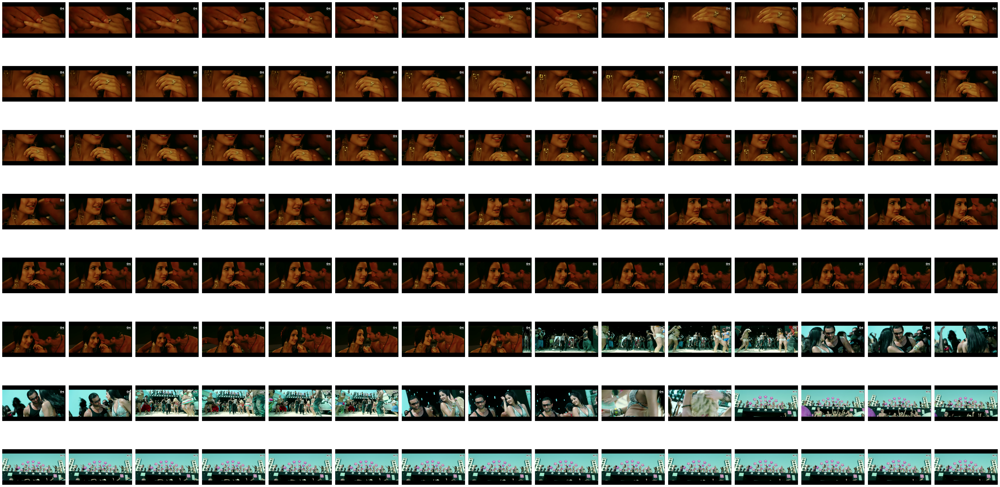

In [12]:
from libs import utils
from libs.utils import display_all_images

if IS_DEV_MODE:
    display_all_images(utils.flat_screen_frames(app_scenes[:10], lambda af:af.frame), 15)

In [13]:
from ultralytics import YOLO
model = YOLO('yolov8n.pt')
for i in tqdm(range(0, len(app_scenes)), desc='Detecting Objects from Frames'):
    scene = app_scenes[i]
    detects = model.track([ app_frame.frame for app_frame in scene.frames ], verbose=False)
    for i in range(len(detects)):
        app_frame = scene.frames[i]
        app_frame.detect = detects[i]


Detecting Objects from Frames:   0%|          | 0/8 [00:00<?, ?it/s]

Processing images to display: 100%|█████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 169.08it/s]


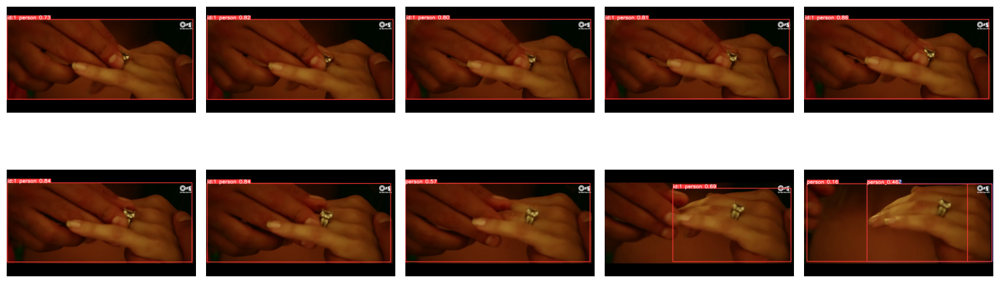

In [14]:
if IS_DEV_MODE:
    display_all_images(utils.flat_screen_frames(app_scenes, lambda af:af.detect.plot())[:10], 5)

In [8]:
yolo_person_class = utils.find_key(model.names, 'person')
for detect in utils.flat_screen_frames(app_scenes, lambda af:af.detect):
    detected_boxes = []
    for box in detect.boxes: 
        if int(box.cls[0]) == yolo_person_class:
            detected_boxes.append(box)
    detect.boxes = detected_boxes

Processing images to display: 100%|█████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 195.04it/s]


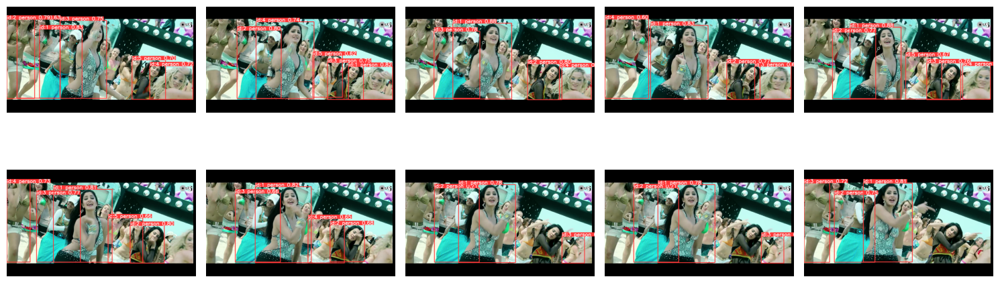

In [9]:
if IS_DEV_MODE:
    display_all_images(utils.flat_screen_frames(app_scenes, lambda af:af.detect.plot())[:10])

In [15]:
from libs import appfacers

import libs
import importlib
importlib.reload(libs.appfacers)

def detect_faces(app_scenes, app_facer, faces_width_threshold=0.1):
    app_facer.init()
    app_frames = utils.flat_screen_frames(app_scenes, lambda af:af)
    for app_frame in tqdm(app_frames, desc='Detecting Faces in Frames'):
        faces = app_facer.detect_faces(app_frame.frame)
        app_frame.faces = faces

app_facer = appfacers.mtcnn
detect_faces(app_scenes[:5], app_facer)

Detecting Faces in Frames:   0%|          | 0/75 [00:00<?, ?it/s]

Verifying Faces in Frames:   0%|          | 0/75 [00:00<?, ?it/s]

Processing images to display: 100%|█████████████████████████████████████████████████████████████████| 75/75 [00:00<00:00, 148.86it/s]


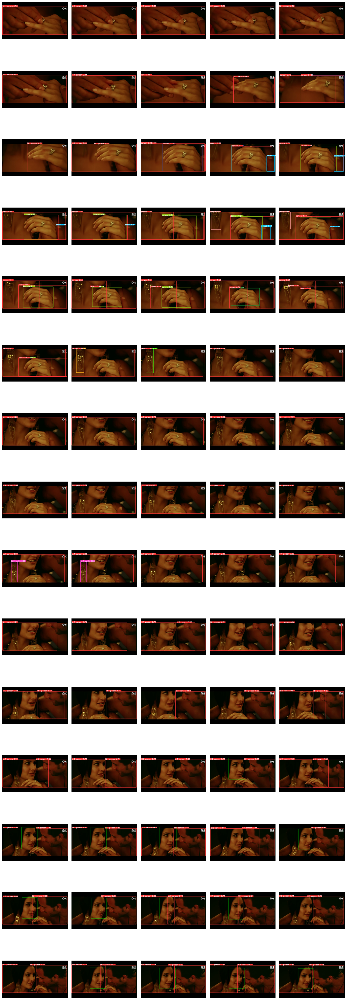

In [16]:
def show_faces(app_scenes, face_getter=lambda frame:frame.faces):
    frame_faces = []
    for app_frame in tqdm(utils.flat_screen_frames(app_scenes, lambda af:af), desc='Verifying Faces in Frames'):
        frame_copy = app_frame.detect.plot().copy()
        for face in face_getter(app_frame):
            x, y, w, h = app_facer.get_boundary(face)
            frame_copy = cv2.rectangle(frame_copy, (x, y), (x + w, y + h), (0, 255, 0), 2)
        frame_faces.append(frame_copy)
    display_all_images(frame_faces)
if IS_DEV_MODE:
    show_faces(app_scenes[:5])

Verifying Faces in Frames:   0%|          | 0/75 [00:00<?, ?it/s]

Processing images to display: 100%|███████████████████████████████████████████████████████████████| 75/75 [00:00<00:00, 148.43it/s]


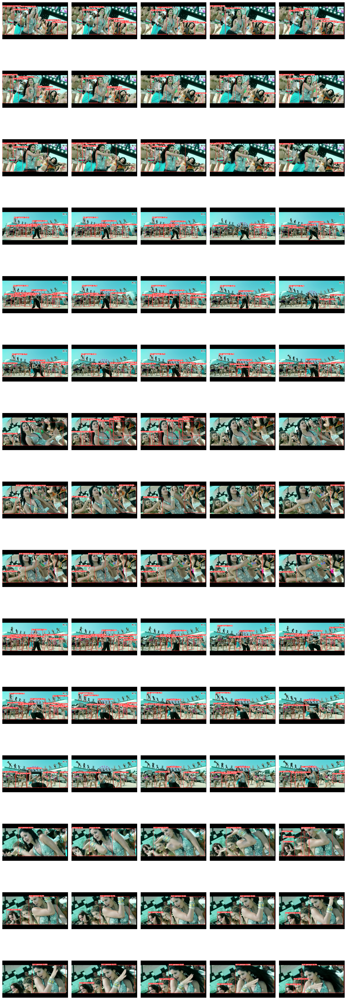

In [34]:
def filter_faces(app_scenes: list[AppScene], face_size_threshold=0.06):
    def filter_face(face):
        face_width = app_facer.get_boundary(face)[2]
        face_frame_ratio = face_width / app_video_meta.width
        return face_frame_ratio >= face_size_threshold
    for app_scene in app_scenes[:1]:
        for app_frame in app_scene.frames[:]:
            app_frame.filtered_faces = [ face for face in app_frame.faces if filter_face(face) ]
                    
filter_faces(app_scenes)
show_faces(app_scenes[:5], lambda frame:frame.filtered_faces)

In [ ]:
def get_cropped_faces(app_scenes):
    frame_faces = []
    for app_frame in tqdm(utils.flat_screen_frames(app_scenes, lambda af:af), desc='Cropping Faces from Frames'):
        frame = app_frame.frame
        for face in app_frame.faces:
            x, y, w, h = app_facer.get_boundary(face)
            frame_faces.append(frame[y:y+h, x:x+w])
    return frame_faces
frame_faces = get_cropped_faces(app_scenes)
if IS_DEV_MODE:
    display_all_images(frame_faces[:50])

In [14]:
def get_face_categories(frame_faces, frame_from=10):
    distance_threshold = 0.7
    face_categories = [[frame_faces[frame_from]]]
    for frame_face in tqdm(frame_faces[frame_from:frame_from+50], 'Recognizing Faces'):
        next_face_categories=face_categories.copy()
        is_found = False
        found_cat_arr = None
        for face_cats in face_categories:
            for face_cat in face_cats:
                verification = DeepFace.verify(frame_face, face_cat, enforce_detection=False)
                if verification['verified'] and verification['distance'] < distance_threshold:
                    is_found = True
                    found_cat_arr = face_cats
                    break
            if is_found: 
                break;    
        if is_found:
            found_cat_arr.append(frame_face)
        else:
            next_face_categories.append([frame_face])
        face_categories=next_face_categories
    return face_categories
face_categories = get_face_categories(frame_faces)

Recognizing Faces:   0%|          | 0/50 [00:00<?, ?it/s]

Processing images to display: 100%|██████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 2809.17it/s]


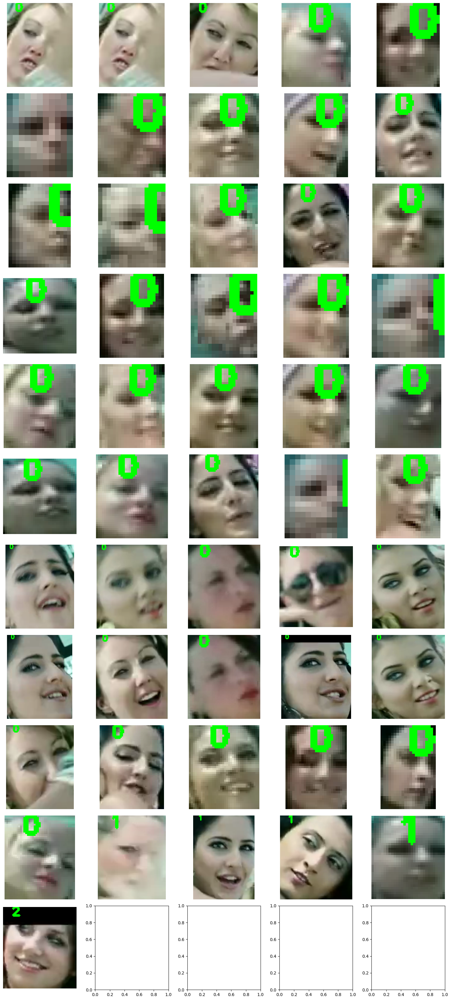

In [15]:
def get_face_display(face_categories):
    position = (10, 10)  # Bottom-left corner of the text in (x, y)
    font = cv2.FONT_HERSHEY_SIMPLEX  # Font type
    font_scale = 0.5  # Font scale (size)
    color = (0, 255, 0)  # Color in BGR (blue, green, red)
    thickness = 2  # Thickness of the lines used to draw the text
    face_display = []
    for face_category_index in range(0, len(face_categories)):
        face_category = face_categories[face_category_index]
        for face in face_category:
            face_copy = face.copy()
            cv2.putText(face_copy, str(face_category_index), position, font, font_scale, color, thickness)
            face_display.append(face_copy)
    return face_display
face_display = get_face_display(face_categories)
display_all_images(face_display)